In [1]:
import os
import requests
import pandas as pd
import geopandas as gpd
import numpy as np
import pickle

TRANSPORT_FRAMES_API = "http://10.32.1.65:5700"
URBAN_API = "https://urban-api.idu.kanootoko.org/api/v1"

In [2]:
territory_gdf = gpd.read_file('data/level_4_territories.geojson').to_crs(32636)
road_gdf = gpd.read_file('data/road.geojson').to_crs(32636)
railways_gdf = gpd.read_file('data/railway_LO.geojson').to_crs(32636)
water = gpd.read_file('data/big water.geojson').to_crs(32636)
airport = gpd.read_file('data/airport.geojson').to_crs(32636)
towns_gdf = gpd.read_file('data/towns_with_status.geojson').to_crs(32636)

In [3]:
territory_gdf = gpd.read_parquet('data/split_gdf.parquet').to_crs(32636)
territory_gdf

,id,geometry
0,0,"POLYGON ((570883.045 6596529.946, 570883.081 6..."
1,1,"POLYGON ((570987.035 6596464.499, 570987.085 6..."
2,2,"POLYGON ((572676.73 6596606.982, 572676.701 65..."
3,3,"POLYGON ((583242.895 6595451.954, 583243.013 6..."
4,4,"POLYGON ((582405.498 6595459.455, 582405.614 6..."
...,...,...
34645,34645,"POLYGON ((279466.739 6647657.982, 279466.837 6..."
34646,34646,"POLYGON ((279467.148 6647660.126, 279467.165 6..."
34647,34647,"POLYGON ((279542.296 6648001.072, 279542.336 6..."
34648,34648,"POLYGON ((279625.847 6648207.164, 279625.886 6..."


In [4]:
# territory_gdf = territory_gdf.overlay(water, how='difference')
# territory_gdf.head()

In [5]:
# Добавляем новый столбец с длиной дороги в километрах
road_gdf['road_length_km'] = road_gdf['geometry'].length / 1000
road_gdf.head()

,physical_object_id,physical_object_type,name,properties,living_building,territories,created_at,updated_at,geometry,road_length_km
0,2212129,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-120,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""primary...",None,"[ { ""id"": 111, ""name"": ""Кировское городское по...",2024-11-26 13:36:41.630000+00:00,2024-11-26 13:36:41.630000+00:00,"LINESTRING (388726.347 6637020.627, 388713.674...",0.015971
1,2212130,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",Р-23,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""primary...",None,"[ { ""id"": 2326, ""name"": ""кордон Глубокий Ручей...",2024-11-26 13:36:41.851000+00:00,2024-11-26 13:36:41.851000+00:00,"LINESTRING (318413.688 6517004.443, 318561.905...",0.392273
2,2212131,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-114,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""trunk"",...",None,"[ { ""id"": 186, ""name"": ""Тихвинское городское п...",2024-11-26 13:36:45.467000+00:00,2024-11-26 13:36:45.467000+00:00,"LINESTRING (529615.157 6616409.736, 529590.351...",1.866937
3,2212132,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-121,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""trunk"",...",None,"[ { ""id"": 1199, ""name"": ""поселок Сапёрное"" } ]",2024-11-26 13:36:45.459000+00:00,2024-11-26 13:36:45.459000+00:00,"LINESTRING (335867.781 6734765.116, 335668.012...",0.447109
4,2212133,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-121,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""seconda...",None,"[ { ""id"": 1173, ""name"": ""поселок Плафторма 69-...",2024-11-26 13:36:45.476000+00:00,2024-11-26 13:36:45.476000+00:00,"LINESTRING (346440.758 6711866.978, 346447.143...",0.024717


In [6]:
# Добавляем новый столбец с длиной дороги в километрах
railways_gdf['road_length_km'] = railways_gdf['geometry'].length / 1000
railways_gdf.head()

,GLOBALID,CLASSID,NUMBER,NAME,CAT_RR,EL_SUPPLY,TRACK_TYPE,NUM_TRACKS,CAPACITY,SUBURBAN_TR,...,EVENT_TIME,SOURCE,NOTE,STATUS,REG_STATUS,built_year,layer,path,geometry,road_length_km
0,5B11B81A-05CF-4E47-8345-130B6B289DA8,602030101,,Северо-Восточный обход Павлово на Неве - Оредеж,7.0,1.0,1.0,3.0,0.0,0.0,...,0.0,,,2.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (379205.593 6635545.721, 379039.913...",3.501744
1,2D6AA273-E08F-4BA4-80B3-BB561FD9EFFD,602030101,,Юго-Западный железнодорожный обход Санкт-Петер...,7.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,2.0,1.0,2030.0,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (308041.472 6649937.16, 307983.753 ...",65.544295
2,A289FEE2-CAB0-4546-A1E5-0E2A816B54F6,602030101,,Бусловская – Вайниккала (искл.),5.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,1.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (246843.638 6755670.538, 246871.412...",2.772776
3,CBE9BC6E-3D87-4A8B-A4F6-0C196C885FD5,602030101,,Юго-Западный железнодорожный обход Санкт-Петер...,7.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,2.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (304012.441 6650457.401, 303896.607...",4.259202
4,3DADEBA5-4619-48FE-B234-3A19F8A9C370,602030101,,Выборг – Каменногорск,3.0,1.0,1.0,3.0,0.0,0.0,...,0.0,,Магистраль с преимущественно пассажирским движ...,1.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (289723.825 6764821.93, 289684.689 ...",39.703301


In [8]:
import geopandas as gpd
import pandas as pd
from shapely.ops import nearest_points
from shapely.geometry import Point


def calculate_transport_provision(territory_gdf, road_gdf, railways_gdf, airport, towns_gdf):
    """
    Оптимизированный расчет обеспеченности транспортной инфраструктурой.
    """
    
    # Вычисляем площадь территории
    territory_gdf['area_km2'] = territory_gdf.geometry.area / 1e6  # км²
    
    # Вычисляем длину дорог внутри территории с помощью spatial join
    road_sjoin = gpd.sjoin(road_gdf, territory_gdf, predicate="intersects")
    rail_sjoin = gpd.sjoin(railways_gdf, territory_gdf, predicate="intersects")

    road_length = road_sjoin.groupby('index_right').geometry.apply(lambda x: x.length.sum()) / 2000  # км
    rail_length = rail_sjoin.groupby('index_right').geometry.apply(lambda x: x.length.sum()) / 2000  # км
    
    # Добавляем длины дорог в основную таблицу
    territory_gdf['road_length_km'] = territory_gdf.index.map(road_length).fillna(0)
    territory_gdf['rail_length_km'] = territory_gdf.index.map(rail_length).fillna(0)

    # Вычисляем площадь населенных пунктов в каждой территории через spatial join
    towns_sjoin = gpd.sjoin(towns_gdf, territory_gdf, predicate="intersects")
    town_area = towns_sjoin.groupby('index_right').geometry.apply(lambda x: x.area.sum()) / 1e6  # км²
    territory_gdf['town_area_km2'] = territory_gdf.index.map(town_area).fillna(0)

    
    # Вычисление расстояния до ближайшего аэропорта
    if not airport.empty:
        airport_union = airport.unary_union
        
        def safe_distance(centroid):
            if centroid.is_empty or not isinstance(centroid, Point):
                return float('inf')
            
            nearest_airport = nearest_points(centroid, airport_union)[1]
            if nearest_airport.is_empty:
                return float('inf')

            return centroid.distance(nearest_airport) / 1000  # Переводим в км
        
        territory_gdf = territory_gdf.copy()  # Избегаем SettingWithCopyWarning
        territory_gdf['airport_distance_km'] = territory_gdf.geometry.centroid.apply(safe_distance)
    else:
        territory_gdf['airport_distance_km'] = float('inf')
        
    # Вычисляем индекс обеспеченности
    territory_gdf['transport_provision_index'] = (
        0.4 * (territory_gdf['rail_length_km'] / territory_gdf['area_km2']) +
        0.3 * (territory_gdf['road_length_km'] / territory_gdf['area_km2']) +
        0.2 * (1 / territory_gdf['airport_distance_km'].replace(0, 1)) +
        0.1 * (1 - (territory_gdf['town_area_km2'] / territory_gdf['area_km2']))
    )
    
    return territory_gdf[['geometry', 'area_km2', 'road_length_km', 'rail_length_km', 'airport_distance_km', 'town_area_km2', 'transport_provision_index']]

# Пример вызова функции
result = calculate_transport_provision(territory_gdf, road_gdf, railways_gdf, airport, towns_gdf)
result

/tmp/ipykernel_3019/3542498749.py:34: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  airport_union = airport.unary_union


,geometry,area_km2,road_length_km,rail_length_km,airport_distance_km,town_area_km2,transport_provision_index
0,"POLYGON ((570883.045 6596529.946, 570883.081 6...",1.373078,1.080722,0.0,40.922757,0.336213,0.316525
1,"POLYGON ((570987.035 6596464.499, 570987.085 6...",0.000771,0.000000,0.0,40.357336,0.000000,0.104956
2,"POLYGON ((572676.73 6596606.982, 572676.701 65...",0.000604,0.000000,0.0,41.837869,0.000000,0.104780
3,"POLYGON ((583242.895 6595451.954, 583243.013 6...",0.045193,0.000000,0.0,52.279729,0.000000,0.103826
4,"POLYGON ((582405.498 6595459.455, 582405.614 6...",0.000198,0.000000,0.0,51.318454,0.000000,0.103897
...,...,...,...,...,...,...,...
34645,"POLYGON ((279466.739 6647657.982, 279466.837 6...",0.326840,0.000000,0.0,37.678098,0.000000,0.105308
34646,"POLYGON ((279467.148 6647660.126, 279467.165 6...",0.046771,0.000000,0.0,38.093646,0.000000,0.105250
34647,"POLYGON ((279542.296 6648001.072, 279542.336 6...",0.016349,0.000000,0.0,38.249958,0.000000,0.105229
34648,"POLYGON ((279625.847 6648207.164, 279625.886 6...",0.027189,0.000000,0.0,38.235167,0.000000,0.105231


In [15]:
print(result['area_km2'].isna().sum())  # Количество NaN
print(result['area_km2'].describe())  # Минимум, максимум


0
count    34650.000000
mean         2.690737
std         48.241729
min          0.000000
25%          0.009016
50%          0.017057
75%          0.034475
max       5895.290760
Name: area_km2, dtype: float64


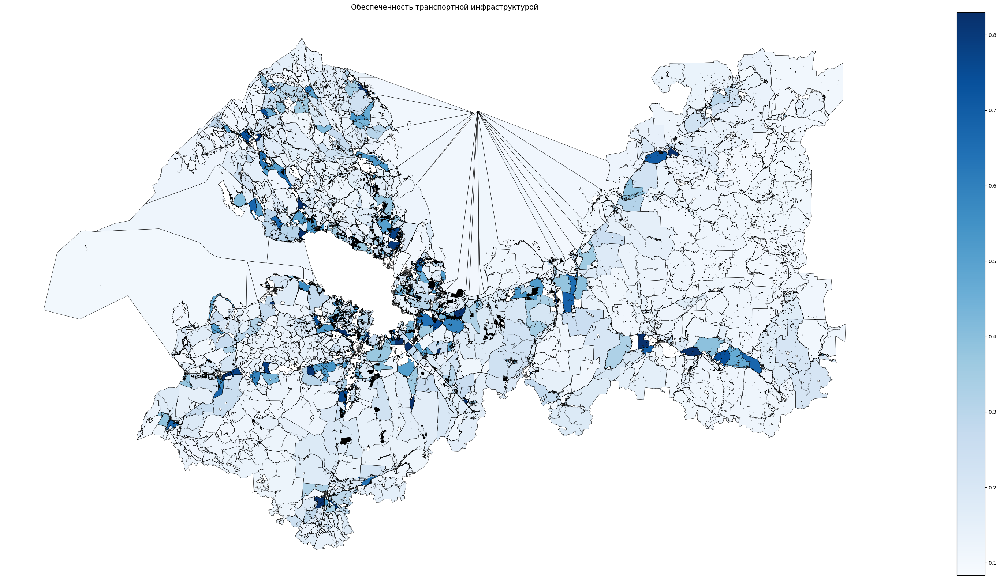

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import json

def visualize_transport_provision(result, road_gdf):
    """
    Визуализирует обеспеченность транспортной инфраструктурой и отображает дороги.
    """
    fig, ax = plt.subplots(figsize=(50, 20))

    # Фильтруем аномальные значения
    result_filtered = result[(result['transport_provision_index'] > 0) & 
                             (result['transport_provision_index'] < 1)]  # Оставляем только нормальные индексы
    
    if result_filtered.empty:
        print("Ошибка: После фильтрации не осталось данных для отображения!")
        return

    # Вычисляем vmin и vmax после фильтрации
    vmin, vmax = result_filtered['transport_provision_index'].quantile([0.01, 0.99])  # 1-й и 99-й процентиль

    # Отображаем карту
    result_filtered.plot(column='transport_provision_index', cmap='Blues', linewidth=0.5, 
                         edgecolor='black', legend=True, ax=ax, vmin=vmin, vmax=vmax)

    # Проверяем, есть ли properties в road_gdf
    if 'properties' in road_gdf.columns and isinstance(road_gdf['properties'].iloc[0], str):  
        road_gdf['properties'] = road_gdf['properties'].apply(json.loads)

        # Определяем ширину дорог
        if 'reg' in road_gdf['properties'].iloc[0]:
            road_gdf['width'] = road_gdf['properties'].apply(lambda x: 1.5 if x.get('reg') == 1 else 0.6)
        else:
            road_gdf['width'] = 0.6
    else:
        road_gdf['width'] = 0.6

    # Визуализация дорог
    if not road_gdf.empty:
        road_gdf.plot(ax=ax, color='black', linewidth=road_gdf['width'], alpha=0.7)

    # Убираем оси и добавляем заголовок
    ax.set_axis_off()
    plt.title("Обеспеченность транспортной инфраструктурой", fontsize=14)
    plt.show()

# Вызов функции
visualize_transport_provision(result, road_gdf)


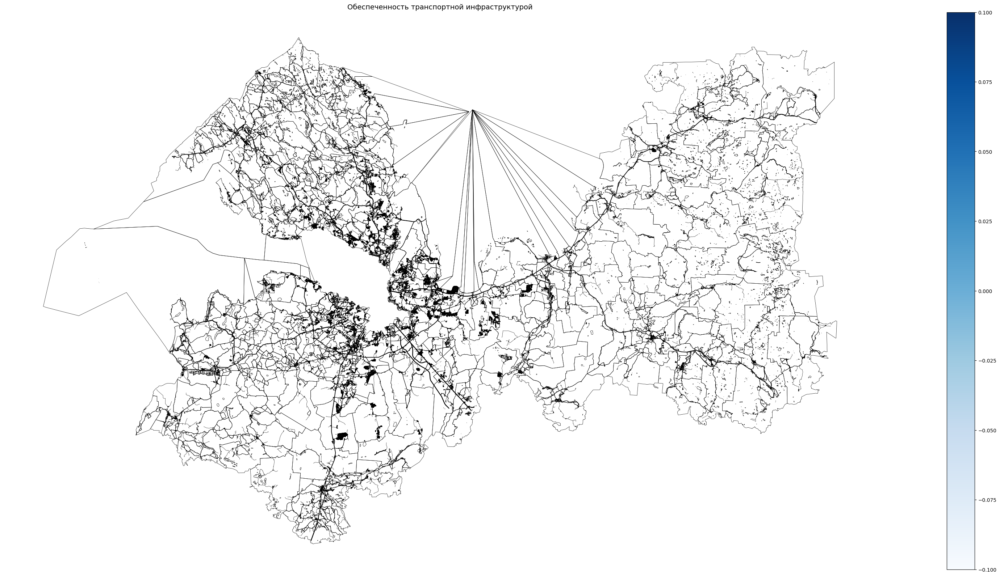

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import json

def visualize_transport_provision(result, road_gdf):
    """
    Визуализирует обеспеченность транспортной инфраструктурой и отображает дороги.
    
    :param result: GeoDataFrame с рассчитанными индексами обеспеченности
    :param road_gdf: GeoDataFrame с дорогами
    """
    fig, ax = plt.subplots(figsize=(50, 20))
    
    # Ограничиваем влияние выбросов, используя 1-й и 99-й процентиль
    vmin, vmax = np.percentile(result['transport_provision_index'], [1, 100])

    # Отображение карты с улучшенной цветовой шкалой
    result.plot(column='transport_provision_index', cmap='Blues', linewidth=0.5, 
                edgecolor='black', legend=True, ax=ax, vmin=vmin, vmax=vmax)
    
    # Преобразуем properties из строки JSON в словарь, если нужно
    if isinstance(road_gdf['properties'].iloc[0], str):  
        road_gdf['properties'] = road_gdf['properties'].apply(json.loads)

    # Определяем ширину дорог в зависимости от свойства "reg"
    road_gdf['width'] = road_gdf['properties'].apply(lambda x: 1.5 if x.get('reg') == 1 else 0.6)

    # Визуализация дорог с прозрачностью 60%
    road_gdf.plot(ax=ax, color='black', linewidth=road_gdf['width'], alpha=0.7)
    
    # Убираем рамку с координатами
    ax.set_axis_off()
    
    # Добавляем заголовок
    plt.title("Обеспеченность транспортной инфраструктурой", fontsize=14)
    plt.show()

# Вызов функции
visualize_transport_provision(result, road_gdf)



# загрузка данных

In [ ]:
def get_territories(parent_id : int | None = None, all_levels = False, geometry : bool = False) -> pd.DataFrame | gpd.GeoDataFrame:
    res = requests.get(f'{URBAN_API}/all_territories{"" if geometry else "_without_geometry"}', {
        'parent_id': parent_id,
        'get_all_levels': all_levels
    })
    res_json = res.json()
    if geometry:
        gdf = gpd.GeoDataFrame.from_features(res_json, crs=4326)
        return gdf.set_index('territory_id', drop=True)
    df = pd.DataFrame(res_json)
    return df.set_index('territory_id', drop=True)

territories_gdf = get_territories(1, all_levels = True, geometry=True)
territories_gdf

,geometry,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at
territory_id,,,,,,,,,,,,,
2,"POLYGON ((34.32834 59.19564, 34.32777 59.19548...","{'id': 2, 'name': 'Бокситогорский муниципальны...","{'id': 1, 'name': 'Бокситогорский муниципальны...",Бокситогорский муниципальный район,3,"{'Малые города': 2, 'Крупные города': 0, 'Числ...","{'id': 328, 'name': 'г. Бокситогорск'}",None,41203000000,41603000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:18.795643Z
3,"POLYGON ((34.42169 59.68391, 34.42428 59.6715,...","{'id': 3, 'name': 'Самойловское сельское посел...","{'id': 2, 'name': 'Самойловское сельское посел...",Самойловское сельское поселение,4,"{'Численность населения': 2154, 'Административ...","{'id': 310, 'name': 'поселок Совхозный'}",None,41203876000,41603476,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:52.703740Z
4,"POLYGON ((34.30682 59.71494, 34.30791 59.71295...","{'id': 3, 'name': 'Большедворское сельское пос...","{'id': 2, 'name': 'Большедворское сельское пос...",Большедворское сельское поселение,4,"{'Численность населения': 1698, 'Административ...","{'id': 427, 'name': 'деревня Большой Двор'}",None,41203812000,41603412,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.396287Z
5,"POLYGON ((34.14251 59.48759, 34.13616 59.49064...","{'id': 3, 'name': 'Пикалевское городское посел...","{'id': 2, 'name': 'Пикалевское городское посел...",Пикалевское городское поселение,4,"{'Численность населения': 20169, 'Администрати...","{'id': 335, 'name': 'г. Пикалево'}",None,41440000000,41603102,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.930089Z
6,"POLYGON ((34.05997 59.15087, 34.06007 59.14658...","{'id': 3, 'name': 'Борское сельское поселение'}","{'id': 2, 'name': 'Борское сельское поселение'}",Борское сельское поселение,4,"{'Численность населения': 3393, 'Административ...","{'id': 2859, 'name': 'деревня Бор'}",None,41203816000,41603416,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:35.367513Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3134,"POLYGON ((31.35423 59.18747, 31.35372 59.18396...","{'id': 8, 'name': 'деревня Александровка'}","{'id': 205, 'name': 'деревня Александровка'}",деревня Александровка,5,{},None,None,41248844002,41648444106,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:01.002037Z
3135,"POLYGON ((31.50972 59.29449, 31.5092 59.29098,...","{'id': 8, 'name': 'деревня Большая Горка'}","{'id': 205, 'name': 'деревня Большая Горка'}",деревня Большая Горка,5,{},None,None,41248860002,41648444131,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:01.099577Z
3136,"POLYGON ((31.49776 59.30349, 31.49724 59.29998...","{'id': 8, 'name': 'деревня Дроздово'}","{'id': 205, 'name': 'деревня Дроздово'}",деревня Дроздово,5,{},None,None,41248860003,41648444146,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:01.193353Z


In [ ]:
level_3_gdf = territories_gdf[territories_gdf['level'] == 4]
level_3_gdf

,geometry,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at
territory_id,,,,,,,,,,,,,
3,"POLYGON ((34.42169 59.68391, 34.42428 59.6715,...","{'id': 3, 'name': 'Самойловское сельское посел...","{'id': 2, 'name': 'Самойловское сельское посел...",Самойловское сельское поселение,4,"{'Численность населения': 2154, 'Административ...","{'id': 310, 'name': 'поселок Совхозный'}",None,41203876000,41603476,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:52.703740Z
4,"POLYGON ((34.30682 59.71494, 34.30791 59.71295...","{'id': 3, 'name': 'Большедворское сельское пос...","{'id': 2, 'name': 'Большедворское сельское пос...",Большедворское сельское поселение,4,"{'Численность населения': 1698, 'Административ...","{'id': 427, 'name': 'деревня Большой Двор'}",None,41203812000,41603412,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.396287Z
5,"POLYGON ((34.14251 59.48759, 34.13616 59.49064...","{'id': 3, 'name': 'Пикалевское городское посел...","{'id': 2, 'name': 'Пикалевское городское посел...",Пикалевское городское поселение,4,"{'Численность населения': 20169, 'Администрати...","{'id': 335, 'name': 'г. Пикалево'}",None,41440000000,41603102,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.930089Z
6,"POLYGON ((34.05997 59.15087, 34.06007 59.14658...","{'id': 3, 'name': 'Борское сельское поселение'}","{'id': 2, 'name': 'Борское сельское поселение'}",Борское сельское поселение,4,"{'Численность населения': 3393, 'Административ...","{'id': 2859, 'name': 'деревня Бор'}",None,41203816000,41603416,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:35.367513Z
7,"POLYGON ((34.06836 59.40315, 34.05535 59.40393...","{'id': 3, 'name': 'Бокситогорское городское по...","{'id': 2, 'name': 'Бокситогорское городское по...",Бокситогорское городское поселение,4,"{'Численность населения': 15960, 'Администрати...","{'id': 328, 'name': 'г. Бокситогорск'}",None,41403000000,41603101,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:36.351332Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,"POLYGON ((31.01271 59.63362, 31.01394 59.63327...","{'id': 3, 'name': 'Нурминское сельское поселен...","{'id': 193, 'name': 'Нурминское сельское посел...",Нурминское сельское поселение,4,"{'Численность населения': 3354, 'Административ...","{'id': 3092, 'name': 'деревня Нурма'}",None,41248864006,41648418,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:19:08.231301Z
204,"POLYGON ((30.58336 59.64993, 30.58367 59.65002...","{'id': 3, 'name': 'Красноборское городское пос...","{'id': 193, 'name': 'Красноборское городское п...",Красноборское городское поселение,4,"{'Численность населения': 4507, 'Административ...","{'id': 3072, 'name': 'городской поселок Красны...",None,41248554000,41648154,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:19:09.784375Z
205,"POLYGON ((31.13126 59.08942, 31.13522 59.09693...","{'id': 3, 'name': 'Трубникоборское сельское по...","{'id': 193, 'name': 'Трубникоборское сельское ...",Трубникоборское сельское поселение,4,"{'Численность населения': 1620, 'Административ...","{'id': 3122, 'name': 'деревня Трубников Бор'}",None,41248844000,41648444,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:19:10.263640Z


In [ ]:
level_3_gdf.explore()

In [ ]:
level_3_gdf.to_file('level_5.geojson')

In [ ]:
import requests
import geopandas as gpd

URBAN_API = "https://urban-api.idu.kanootoko.org/api/v1"

params = {
    "territory_id" : 1,
    "service_type_id": 82,  # ID функции физического объекта
}

# Формируем URL для конкретной территории
territory_id = 1  # Пример ID территории
url = f"{URBAN_API}/territory/{territory_id}/services_geojson"

# Выполняем GET-запрос
response = requests.get(url, params=params)

res_json = response.json()
gdf = gpd.GeoDataFrame.from_features(res_json, crs=4326)
gdf

,geometry,service_id,service_type,territory_type,name,capacity_real,territories,properties,created_at,updated_at
0,"MULTIPOLYGON (((29.80363 59.70985, 29.80609 59...",589472,"{'service_type_id': 82, 'urban_function': {'id...",None,Ропша,10000,"[{'id': 1088, 'name': 'деревня Глядино'}]","{'name': 'Ропша', 'osm_id': '120159700', 'is_c...",2024-10-10T19:03:09.018828Z,2024-10-10T19:03:09.018828Z
1,"MULTIPOLYGON (((31.47636 59.84122, 31.47664 59...",589473,"{'service_type_id': 82, 'urban_function': {'id...",None,Путилово,10000,"[{'id': 108, 'name': 'Путиловское сельское пос...","{'name': 'Путилово', 'osm_id': '127166902', 'i...",2024-10-10T19:03:09.327439Z,2024-10-10T19:03:09.327439Z
2,"MULTIPOLYGON (((30.024 58.67899, 30.02596 58.6...",589474,"{'service_type_id': 82, 'urban_function': {'id...",None,(unnamed),10000,"[{'id': 140, 'name': 'Заклинское сельское посе...","{'osm_id': '87229455', 'is_capacity_real': False}",2024-10-10T19:03:09.355623Z,2024-10-10T19:03:09.355623Z
3,"MULTIPOLYGON (((33.58817 59.65265, 33.5898 59....",589475,"{'service_type_id': 82, 'urban_function': {'id...",None,(unnamed),10000,"[{'id': 2829, 'name': 'деревня Паголда'}]","{'osm_id': '316800479', 'is_capacity_real': Fa...",2024-10-10T19:03:09.357854Z,2024-10-10T19:03:09.357854Z
4,"MULTIPOLYGON (((29.983 59.48469, 29.98217 59.4...",589476,"{'service_type_id': 82, 'urban_function': {'id...",None,Сиворицы-2,10000,"[{'id': 2200, 'name': 'деревня Рябизи'}]","{'name': 'Сиворицы-2', 'osm_id': '1213570135',...",2024-10-10T19:03:09.358008Z,2024-10-10T19:03:09.358008Z
5,"MULTIPOLYGON (((28.72781 60.46191, 28.73004 60...",589477,"{'service_type_id': 82, 'urban_function': {'id...",None,Прибылово,10000,"[{'id': 55, 'name': 'Приморское городское посе...","{'name': 'Прибылово', 'osm_id': '2248596', 'is...",2024-10-10T19:03:09.358590Z,2024-10-10T19:03:09.358590Z
6,"MULTIPOLYGON (((30.0059 59.3541, 30.01403 59.3...",589478,"{'service_type_id': 82, 'urban_function': {'id...",None,Сиверский,10000,"[{'id': 67, 'name': 'Гатчинский муниципальный ...","{'name': 'Сиверский', 'osm_id': '252291127', '...",2024-10-10T19:03:09.362491Z,2024-10-10T19:03:09.362491Z
7,"MULTIPOLYGON (((29.64453 59.72244, 29.64853 59...",589479,"{'service_type_id': 82, 'urban_function': {'id...",None,Гостилицы,10000,"[{'id': 123, 'name': 'Гостилицкое сельское пос...","{'name': 'Гостилицы', 'osm_id': '122385688', '...",2024-10-10T19:03:11.642849Z,2024-10-10T19:03:11.642849Z
8,"MULTIPOLYGON (((30.27431 59.60399, 30.27503 59...",589480,"{'service_type_id': 82, 'urban_function': {'id...",None,Корпикюля,10000,"[{'id': 2154, 'name': 'деревня Шаглино'}]","{'name': 'Корпикюля', 'osm_id': '96886764', 'i...",2024-10-10T19:03:11.919207Z,2024-10-10T19:03:11.919207Z
9,"MULTIPOLYGON (((29.2128 59.40683, 29.21279 59....",589481,"{'service_type_id': 82, 'urban_function': {'id...",None,ВПП Сельскохозяйственной авиации,10000,"[{'id': 1365, 'name': 'деревня Смердовицы'}]","{'name': 'ВПП Сельскохозяйственной авиации', '...",2024-10-10T19:03:11.922185Z,2024-10-10T19:03:11.922185Z


In [ ]:
gdf.to_file('airport.geojson')